# DATA VISUALIZATION

In [1]:
!pip install pandas matplotlib wordcloud
!pip install plotly


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from wordcloud import WordCloud
sns.set(color_codes=True)


In [3]:
weather=pd.read_csv('weather_classification_data.csv')

In [4]:
weather.head()

,Temperature,Humidity,Wind Speed,Precipitation (%),Cloud Cover,Atmospheric Pressure,UV Index,Season,Visibility (km),Location,Weather Type
0,14,73,9.5,82,partly cloudy,1010.82,2,Winter,3.5,inland,Rainy
1,39,96,8.5,71,partly cloudy,1011.43,7,Spring,10.0,inland,Cloudy
2,30,64,7.0,16,clear,1018.72,5,Spring,5.5,mountain,Sunny
3,38,83,1.5,82,clear,1026.25,7,Spring,1.0,coastal,Sunny
4,27,74,17.0,66,overcast,990.67,1,Winter,2.5,mountain,Rainy


In [5]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13200 entries, 0 to 13199
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Temperature           13200 non-null  int64  
 1   Humidity              13200 non-null  int64  
 2   Wind Speed            13200 non-null  float64
 3   Precipitation (%)     13200 non-null  int64  
 4   Cloud Cover           13200 non-null  object 
 5   Atmospheric Pressure  13200 non-null  float64
 6   UV Index              13200 non-null  int64  
 7   Season                13200 non-null  object 
 8   Visibility (km)       13200 non-null  float64
 9   Location              13200 non-null  object 
 10  Weather Type          13200 non-null  object 
dtypes: float64(3), int64(4), object(4)
memory usage: 1.1+ MB


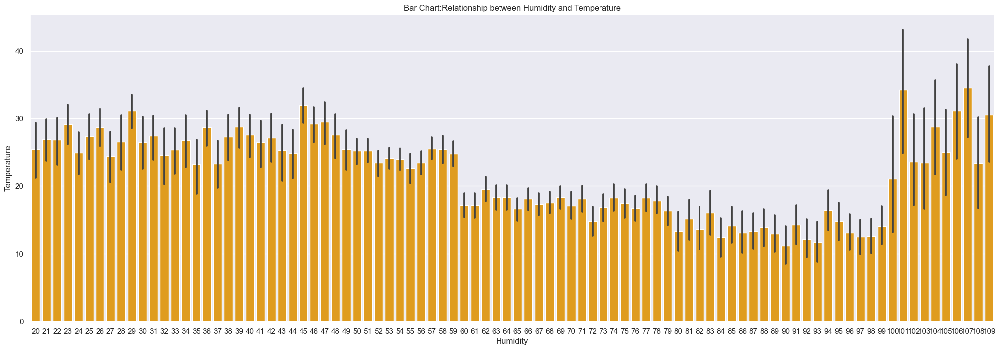

In [6]:
#bar chart
plt.figure(figsize=(25, 8))
sns.barplot(x='Humidity',y='Temperature', data=weather, color='orange')
plt.xlabel('Humidity')
plt.ylabel('Temperature')
plt.title('Bar Chart:Relationship between Humidity and Temperature')
plt.show()

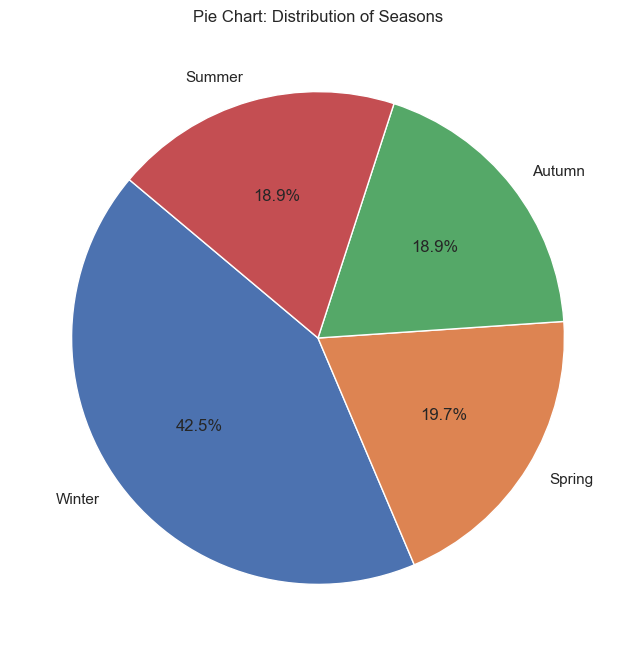

In [7]:
#piechart
weather_counts = weather['Season'].value_counts()
plt.figure(figsize=(10, 8))
plt.pie(weather_counts, labels=weather_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart: Distribution of Seasons')
plt.show()


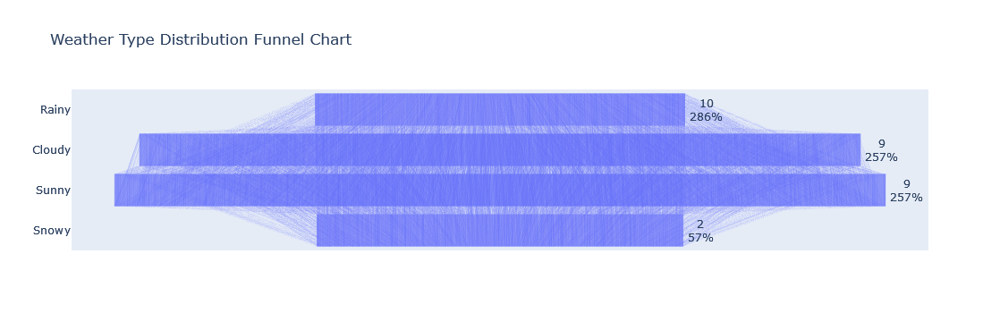

In [8]:
#funnel chart
weather=pd.read_csv('weather_classification_data.csv')
weather_counts = weather['Weather Type'].value_counts().reset_index()
weather_counts.columns = ['Weather Type', 'Count']
fig = go.Figure(go.Funnel(
    y=weather['Weather Type'],
    x=weather['Visibility (km)'],
    textinfo='value+percent initial'
))
fig.update_layout(title='Weather Type Distribution Funnel Chart')
fig.show()

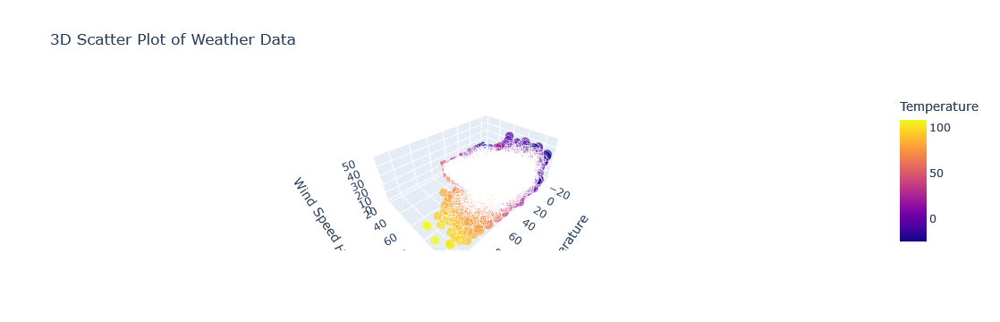

In [9]:
#3d scatterplot
fig = px.scatter_3d(weather,
                    x='Temperature',   
                    y='Humidity',       
                    z='Wind Speed',    
                    color='Temperature',  
                    size='Humidity',
                    hover_name='Location',  # Display location name on hover
                    title='3D Scatter Plot of Weather Data')  
fig.show()

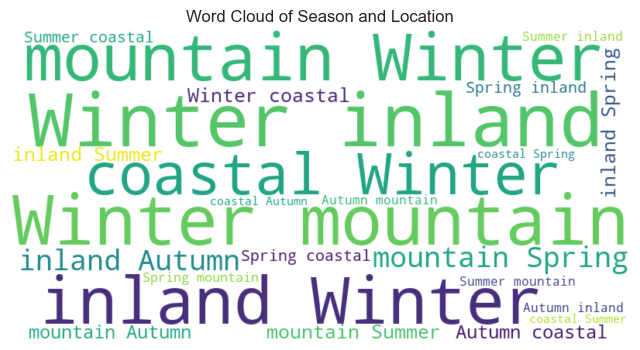

In [10]:
#wordcloud
df = pd.read_csv('weather_classification_data.csv')
text = ' '.join(df[['Season','Location']].astype(str).values.flatten()) #singlist .tolist()
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Season and Location')
plt.axis('off')
plt.show()

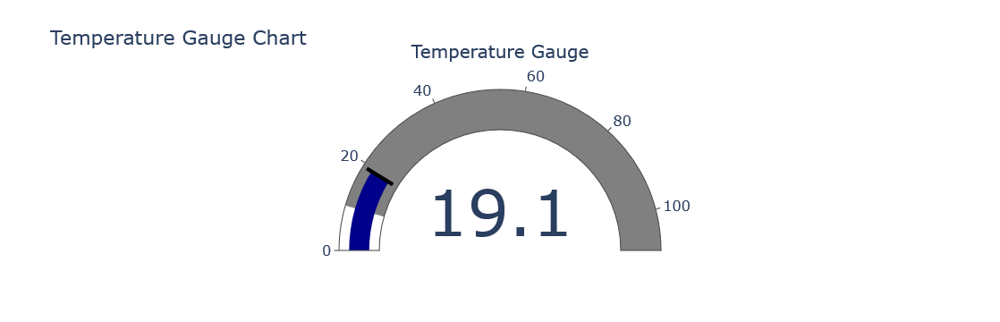

In [11]:
#gauge chart
df = pd.read_csv('weather_classification_data.csv')
column_name = 'Temperature'
value = weather[column_name].mean()  # Calculate mean temperature

fig = go.Figure(go.Indicator(
    mode = "gauge+number",
    value = value,
    domain = {'x': [0, 1], 'y': [0, 1]},
    title = {'text': f"{column_name} Gauge"},
    gauge = {
        'axis': {'range': [None, df['Humidity'].max()]},  # Adjust range based on Humidity data
        'bar': {'color': "darkblue"},
        'steps' : [
            {'range': [df['Humidity'].min(), df['Wind Speed'].mean()], 'color': "lightgray"},
            {'range': [df['Wind Speed'].mean(), df['Humidity'].max()], 'color': "gray"}],
        'threshold': {
            'line': {'color': "black", 'width': 4},
            'thickness': 0.75,
            'value': value}
    }
))


fig.update_layout(
    title_text = f'{column_name} Gauge Chart',
    font_size = 16
)
fig.show()


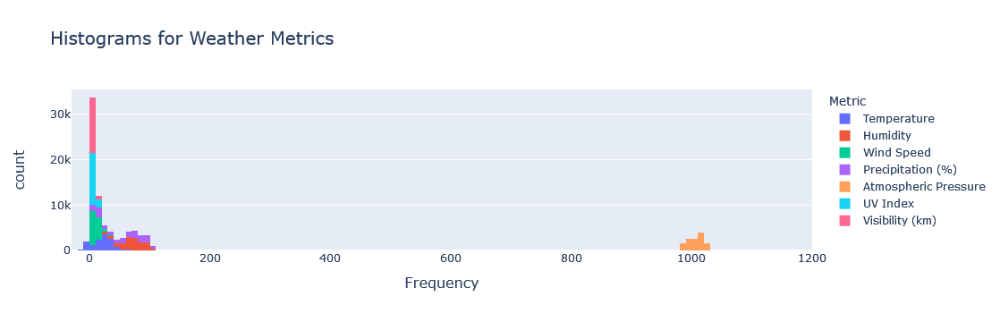

In [12]:
#histogram
df = pd.read_csv('weather_classification_data.csv')

numeric_columns = ['Temperature', 'Humidity', 'Wind Speed', 'Precipitation (%)', 
                   'Atmospheric Pressure', 'UV Index', 'Visibility (km)']


fig = px.histogram(df, x=numeric_columns, title='Histograms for Weather Metrics',
                   labels={'value': 'Frequency', 'variable': 'Metric'})


fig.update_layout(
    title_font_size=20,
    xaxis_title_font_size=16,
    yaxis_title_font_size=16
)

fig.show()

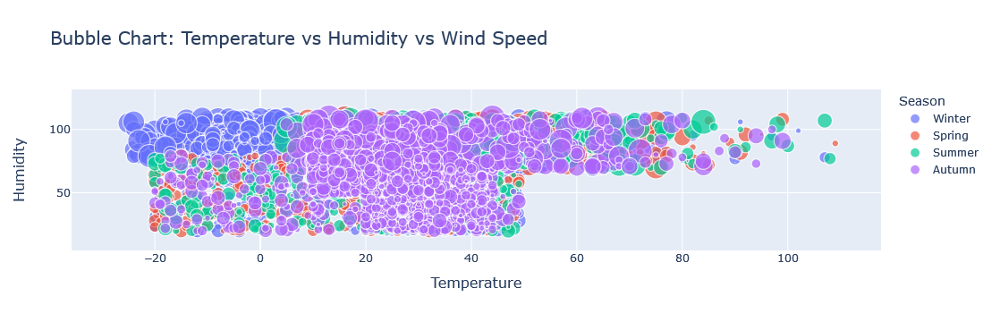

In [13]:
#bubble chart
df = pd.read_csv('weather_classification_data.csv')
x_variable = 'Temperature'    
y_variable = 'Humidity'       
size_variable = 'Wind Speed'  
color_variable = 'Season'     
fig = px.scatter(df, x=x_variable, y=y_variable, size=size_variable, color=color_variable,
                 hover_name=color_variable, log_x=False, size_max=30,
                 title=f'Bubble Chart: {x_variable} vs {y_variable} vs {size_variable}')
fig.update_layout(
    xaxis_title=x_variable,
    yaxis_title=y_variable,
    title_font_size=20,
    xaxis_title_font_size=16,
    yaxis_title_font_size=16
)
fig.show()

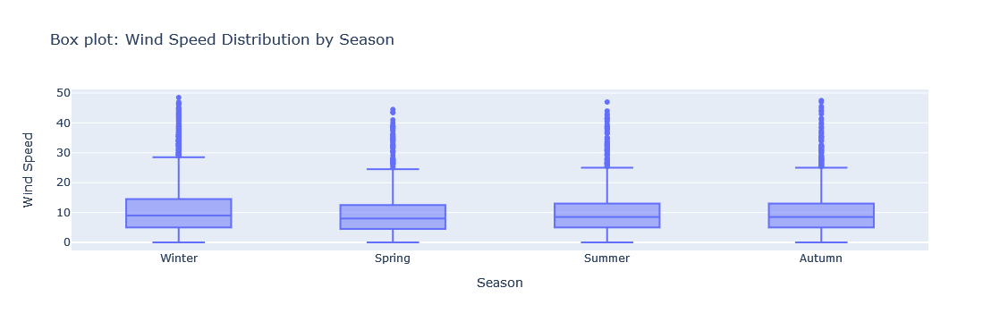

In [14]:
#boxplot
fig = px.box(weather, x='Season', y='Wind Speed', title='Box plot: Wind Speed Distribution by Season', labels={'Season': 'Season', 'Wind Speed': 'Wind Speed'})


fig.show()


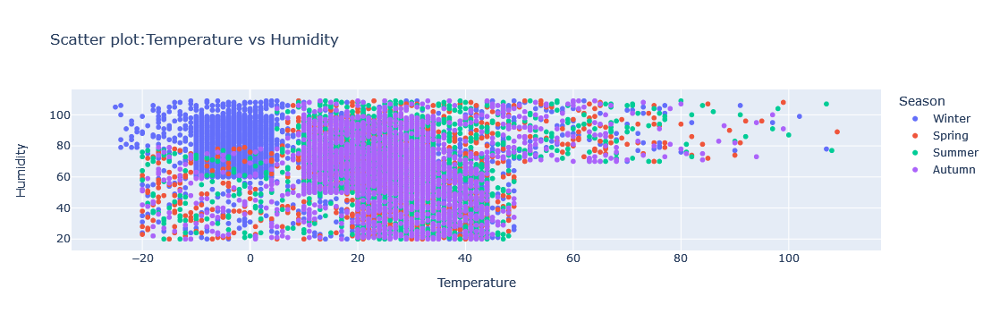

In [15]:
#  scatter plot
fig = px.scatter(weather, x='Temperature', y='Humidity', color='Season', title='Scatter plot:Temperature vs Humidity',
                 labels={'Temperature': 'Temperature', 'Humidity': 'Humidity'})


fig.show()


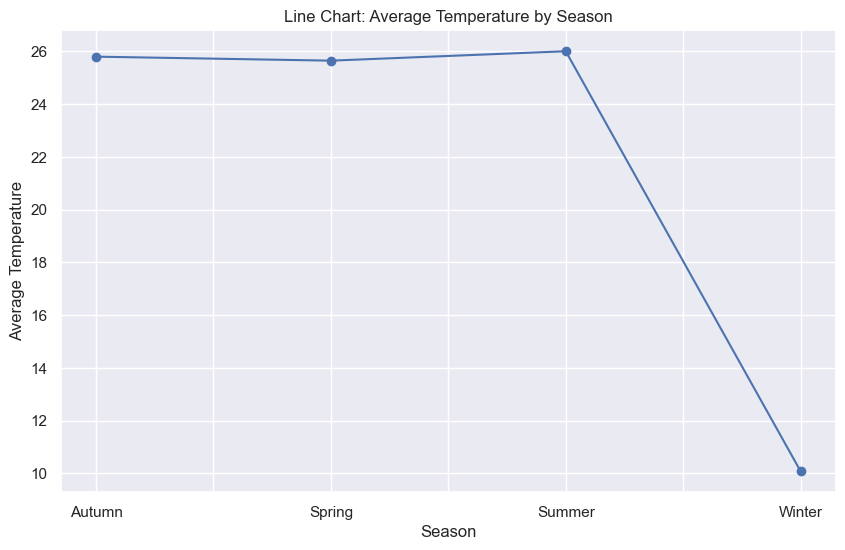

In [16]:
#line chart
df = pd.read_csv('weather_classification_data.csv')
seasonal_avg_temp = df.groupby('Season')['Temperature'].mean()
plt.figure(figsize=(10, 6))
seasonal_avg_temp.plot(kind='line', marker='o', color='b')
plt.title('Line Chart: Average Temperature by Season')
plt.xlabel('Season')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()